<a href="https://colab.research.google.com/github/QjaYo/Computer-Vision/blob/main/cv_assignment4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv_imshow
import subprocess
subprocess.call("pip install -U opencv_python".split())

0

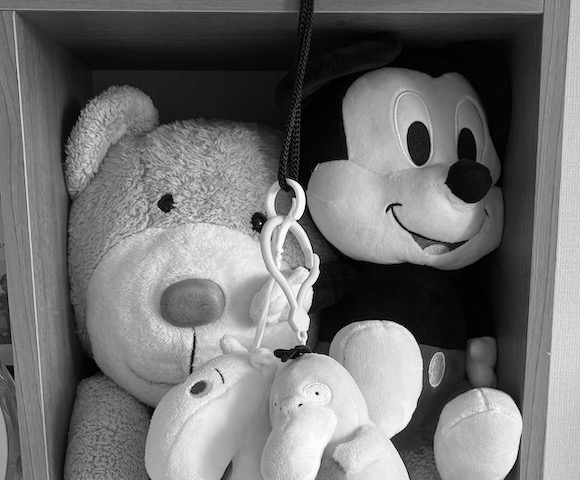

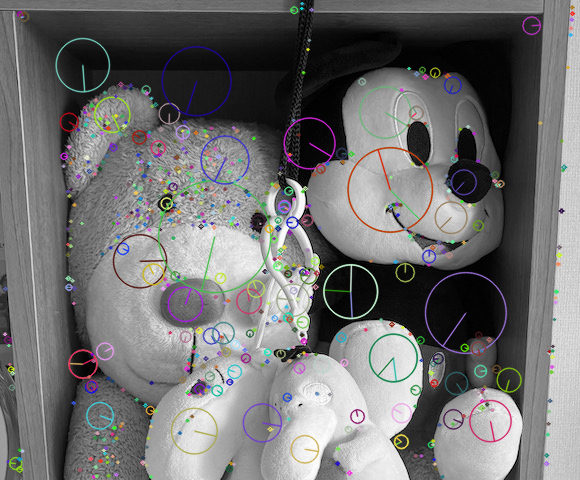

In [ ]:
#1-1

img = cv.imread('gdrive/MyDrive/MachineVision/assignment4/dolls.jpeg', cv.IMREAD_GRAYSCALE)

#480px
img = img[:480]

sift = cv.SIFT_create()
kp = sift.detect(img, None)

img_blob = cv.drawKeypoints(img, kp, img, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv_imshow(img)
cv_imshow(img_blob)

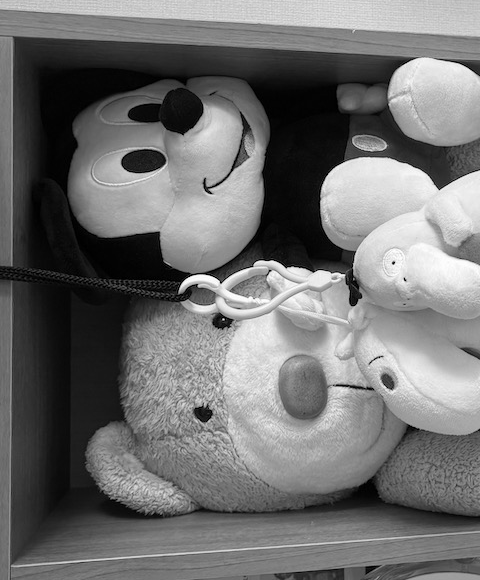

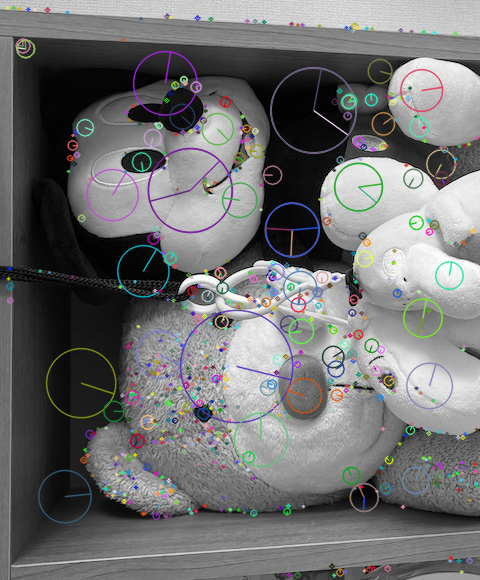

In [ ]:
#1-2

img_rot90 = cv.rotate(img, cv.ROTATE_90_COUNTERCLOCKWISE)

sift = cv.SIFT_create()
kp = sift.detect(img_rot90, None)
img_rot90_blob = cv.drawKeypoints(img_rot90, kp, img_rot90, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv_imshow(img_rot90)
cv_imshow(img_rot90_blob)

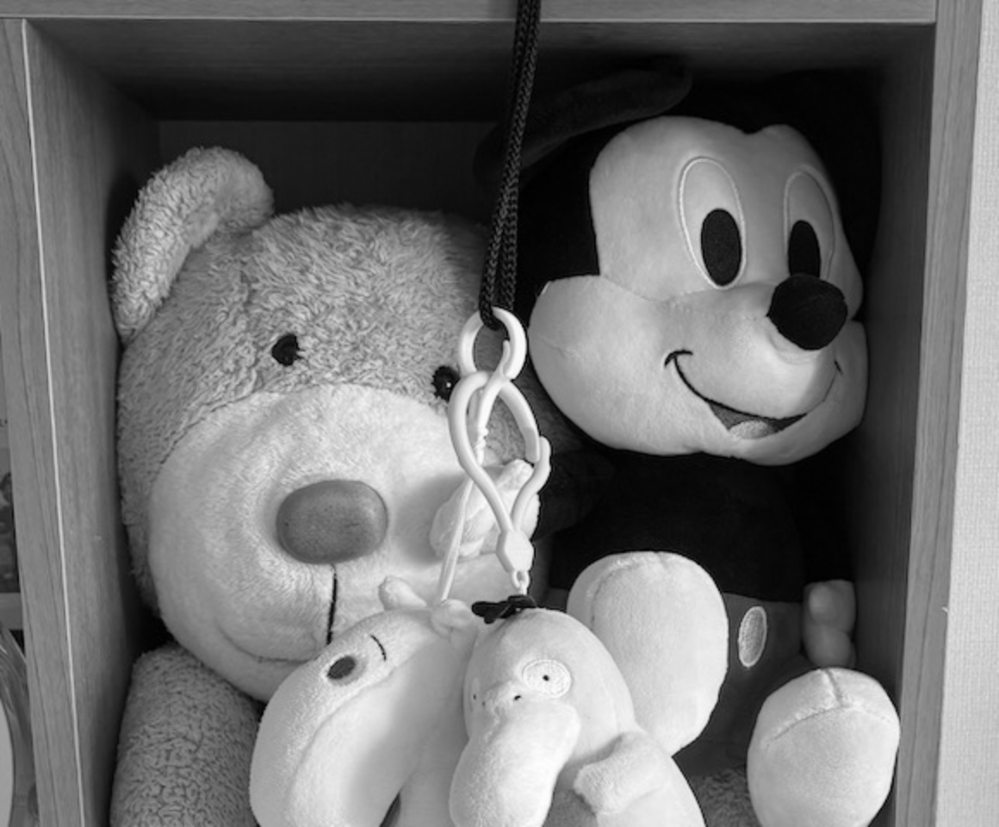

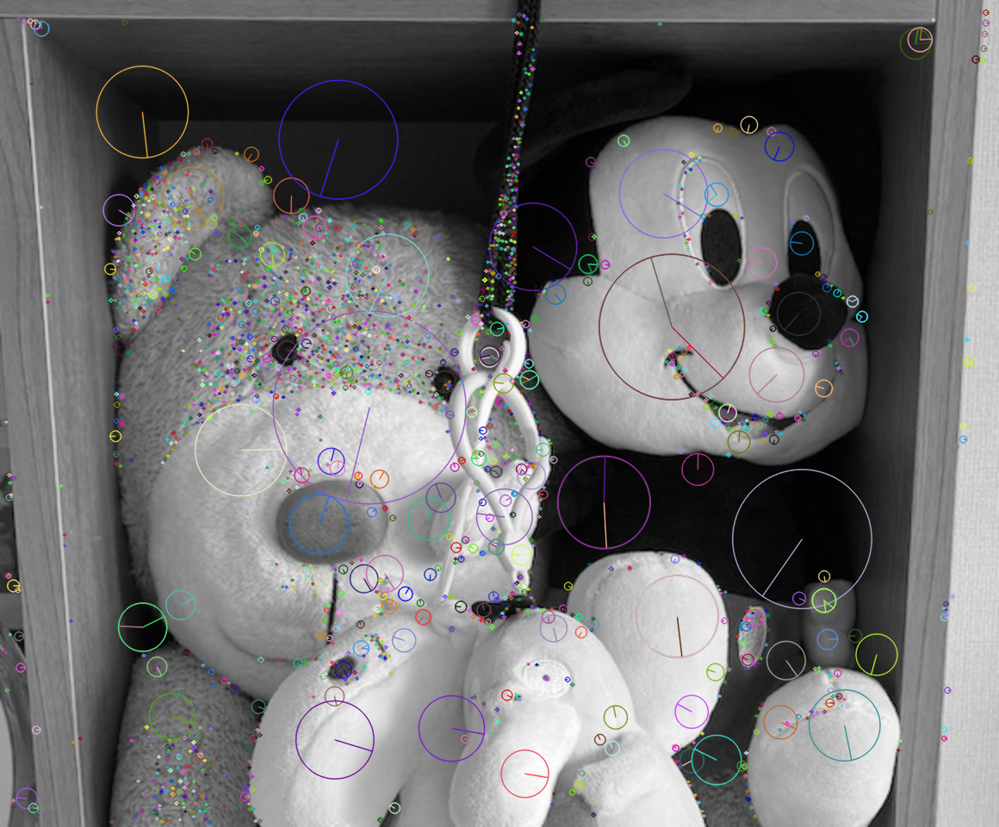

In [ ]:
#1-3

img_2X = cv.resize(img, (0,0), fx=2, fy=2)

sift = cv.SIFT_create()
kp = sift.detect(img_2X, None)
img_2X_blob = cv.drawKeypoints(img_2X, kp, img_2X, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv_imshow(img_2X)
cv_imshow(img_2X_blob)

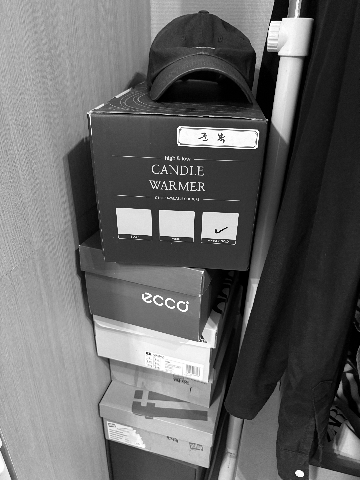

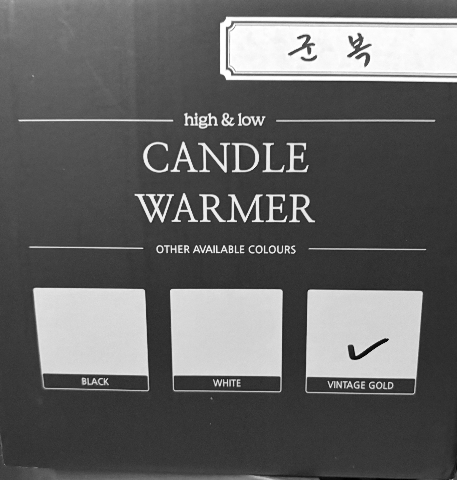

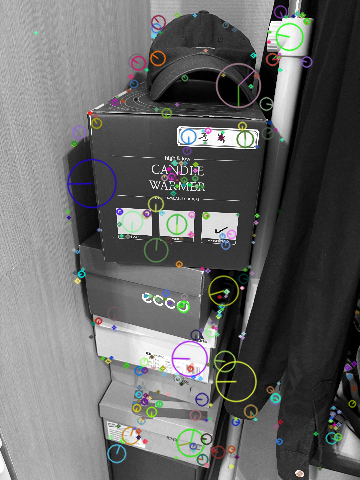

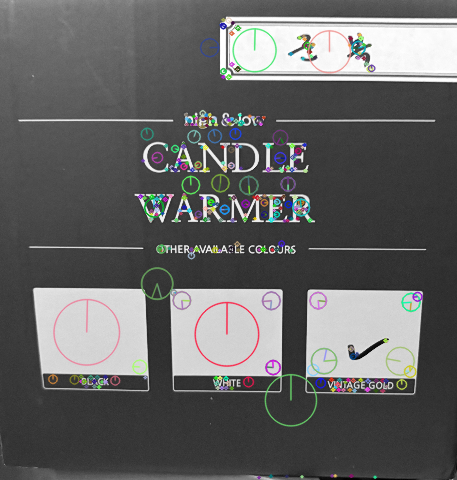

In [ ]:
#2-1

img1 = cv.imread('gdrive/MyDrive/MachineVision/assignment4/box.jpeg', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('gdrive/MyDrive/MachineVision/assignment4/box_zoom.jpeg', cv.IMREAD_GRAYSCALE)

#480px
target_h = 480
h1, w1 = img1.shape[:2]
sf1 = target_h / h1
img1 = cv.resize(img1, (int(w1*sf1), target_h))
h2, w2 = img2.shape[:2]
sf2 = target_h / h2
img2 = cv.resize(img2, (int(w2*sf2), target_h))

cv_imshow(img1)
cv_imshow(img2)

sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

img1 = cv.drawKeypoints(img1, kp1, img1, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2 = cv.drawKeypoints(img2, kp2, img2, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv_imshow(img1)
cv_imshow(img2)

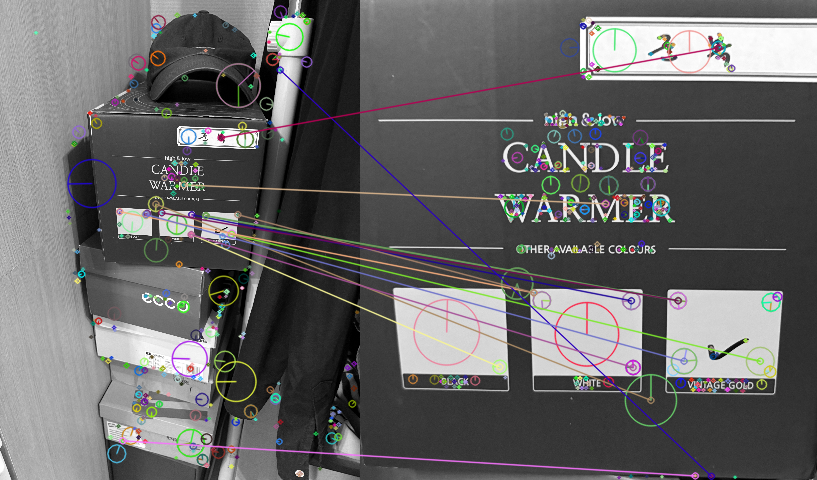

In [ ]:
#2-2

bf = cv.BFMatcher()
matches = bf.match(des1, des2)

matches = sorted(matches, key=lambda x:x.distance)

img3 = cv.drawMatches(img1, kp1, img2, kp2, matches[:15], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv_imshow(img3)

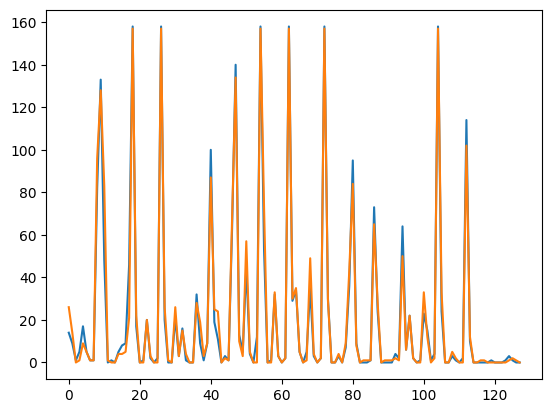

([<matplotlib.lines.Line2D at 0x78cb4fa3ee70>], None)

In [ ]:
#2-3

import matplotlib.pyplot as plt
plt.plot(np.arange(128), des1[matches[0].queryIdx])
plt.plot(np.arange(128), des2[matches[0].trainIdx]), plt.show()

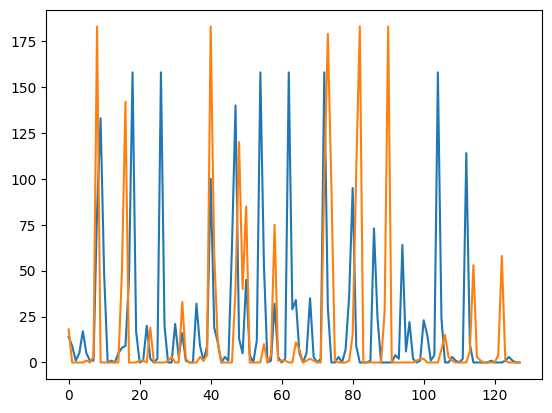

([<matplotlib.lines.Line2D at 0x78cb4f8e02c0>], None)

In [ ]:
#2-4

plt.plot(np.arange(128), des1[matches[0].queryIdx])
plt.plot(np.arange(128), des2[matches[60].trainIdx]), plt.show()

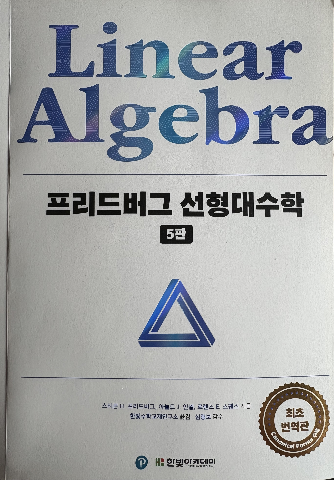

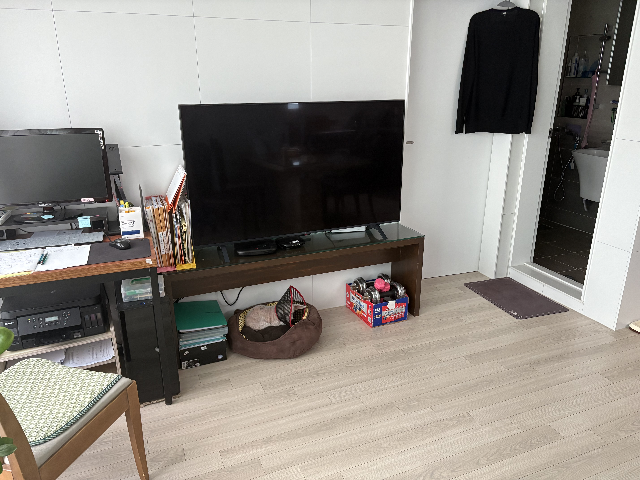

In [ ]:
#3-1

img1 = cv.imread('gdrive/MyDrive/MachineVision/assignment4/book.jpeg')
img2 = cv.imread('gdrive/MyDrive/MachineVision/assignment4/television.jpeg')

#480px
h1,w1 = img1.shape[:2]
aspect1 = h1/w1
h2,w2 = img2.shape[:2]
aspect2 = h2/w2
img1 = cv.resize(img1, (int(480 / aspect1), 480))
img2 = cv.resize(img2, (int(480 / aspect2), 480))

h1,w1 = img1.shape[:2]
h2,w2 = img2.shape[:2]

pts_img1 = np.array([[0,0], [w1-1,0], [w1-1,h1-1], [0,h1-1]], dtype=float)
pts_img2 = np.array([[180,105], [402,99], [397,218], [194,245]], dtype=float)

cv_imshow(img1)
cv_imshow(img2)

#(180,105)   (402, 99)
#(194,245)   (397,218)

In [ ]:
#3-2

im = img1
x = np.array([[0,0,1], [w1-1,0,1], [w1-1,h1-1,1], [0,h1-1,1]], dtype=float)

im_ = img2
x_ = np.array([[180,105,1], [402,99,1], [397,218,1], [194,245,1]], dtype=float)

A1 = np.hstack((np.zeros((len(x_), 3)),
                -np.expand_dims(x_[:,2], axis=1)*x,
                 np.expand_dims(x_[:,1], axis=1)*x))
A2 = np.hstack((np.expand_dims(x_[:,2], axis=1)*x,
                np.zeros((len(x_),3)),
                -np.expand_dims(x_[:,0], axis=1)*x))
A = np.vstack((A1, A2))

u, s, vh = np.linalg.svd(A, full_matrices=True)
h = vh[-1,:]/vh[-1,-1];
h = np.reshape(h, (3,3)) #homography

print(h)

[[9.06680888e-01 6.91182700e-02 1.80000000e+02]
 [4.10899618e-02 3.42653020e-01 1.05000000e+02]
 [5.97050302e-04 2.05622230e-04 1.00000000e+00]]


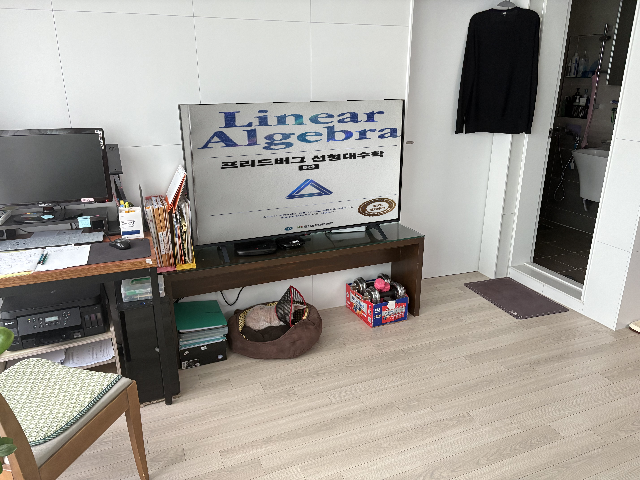

In [ ]:
#3-3

cv.fillConvexPoly(im_, pts_img2.astype(int), 0)

im_temp = cv.warpPerspective(im, h, (im_.shape[1], im_.shape[0]))
im_result = im_ + im_temp
cv_imshow(im_result)

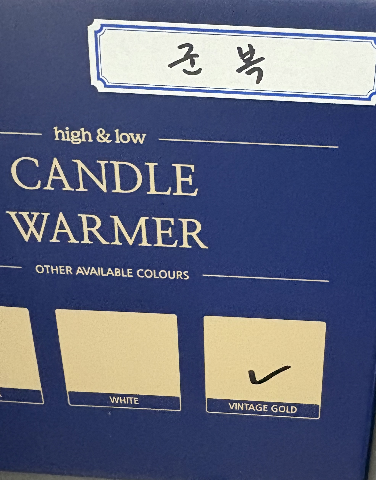

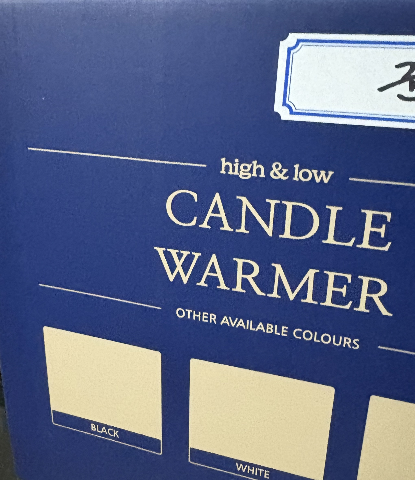

In [ ]:
#4-1

img1 = cv.imread('gdrive/MyDrive/MachineVision/assignment4/rot1.jpeg')
img2 = cv.imread('gdrive/MyDrive/MachineVision/assignment4/rot2.jpeg')

#480px
h1,w1 = img1.shape[:2]
aspect1 = h1/w1
h2,w2 = img2.shape[:2]
aspect2 = h2/w2
img1 = cv.resize(img1, (int(480 / aspect1), 480))
img2 = cv.resize(img2, (int(480 / aspect2), 480))

cv_imshow(img1)
cv_imshow(img2)

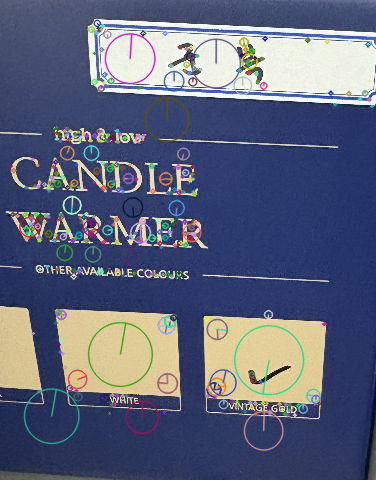

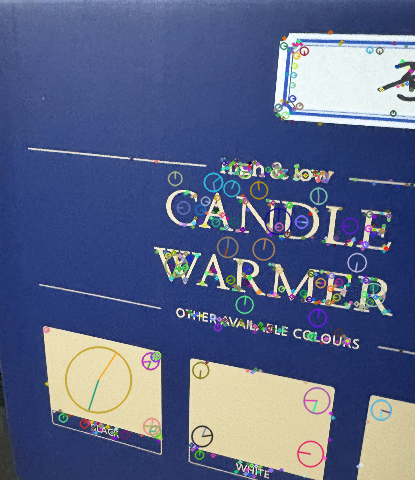

In [ ]:
#4-2

sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

img1_blob = cv.drawKeypoints(img1, kp1, img1, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_blob = cv.drawKeypoints(img2, kp2, img2, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv_imshow(img1)
cv_imshow(img2)

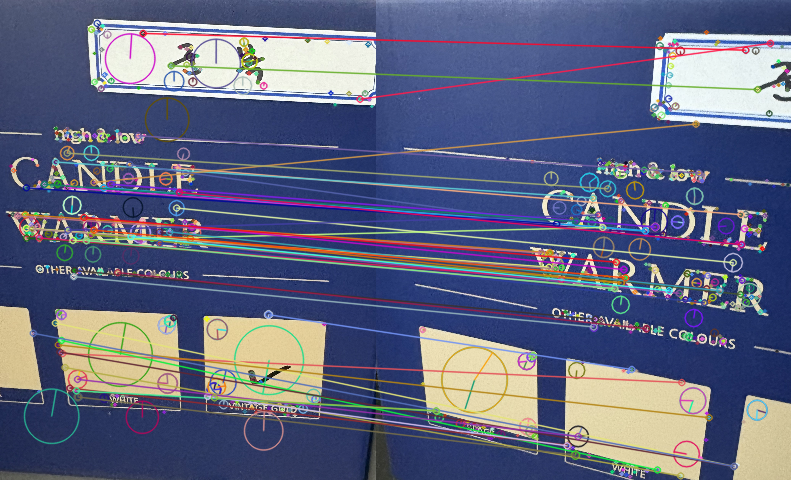

In [ ]:
#4-3

bf = cv.BFMatcher()
matches = bf.match(des1, des2)

matches = sorted(matches, key=lambda x:x.distance)

img3 = cv.drawMatches(img1, kp1, img2, kp2, matches[:60], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv_imshow(img3)

In [ ]:
#4-4

pts_img1 = np.float32([ kp1[m.queryIdx].pt for m in matches[:60] ])
pts_img2 = np.float32([ kp2[m.trainIdx].pt for m in matches[:60] ])

thresh = 3.0
h, status = cv.findHomography(pts_img1, pts_img2, cv.RANSAC, thresh)
print(h)


[[ 9.92300504e-01 -1.51352874e-01  1.83897579e+02]
 [-5.37497911e-02  1.12577155e+00  1.59481993e+01]
 [-6.48264453e-04  1.41567520e-04  1.00000000e+00]]


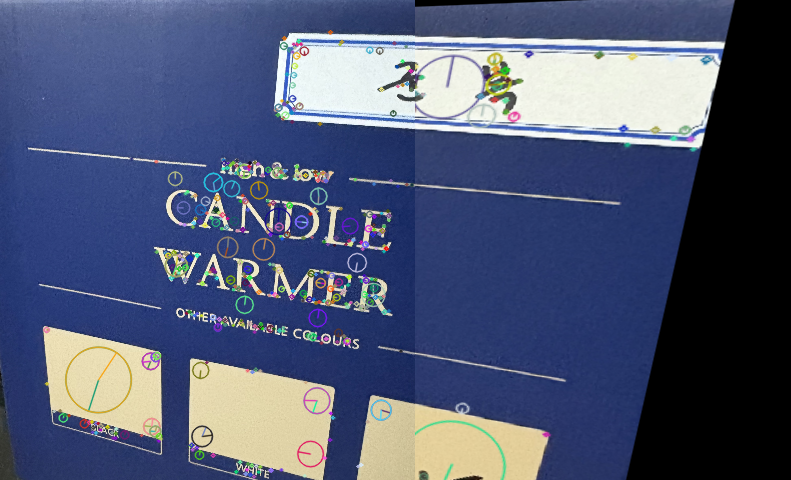

In [ ]:
#4-5

im_out = cv.warpPerspective( img1, h, (img2.shape[1] + img1.shape[1], img2.shape[0]) )

im_out[0:img2.shape[0], 0:img2.shape[1]] = img2

cv_imshow(im_out)